In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import LabelEncoder

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Capstone Project/Crime_data.csv")

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

class CrimeAnalyzer:
    def __init__(self):
        pass

    def plot_categorical_distribution(self, dataframe, categorical_columns):
        for column in categorical_columns:
            plt.figure(figsize=(10, 6))
            ax = sns.countplot(y=column, data=dataframe, order=dataframe[column].value_counts().index[::-1], palette='viridis')
            plt.title(f'Distribution of {column}')
            plt.xlabel('Count')
            plt.ylabel(column)
            for p in ax.patches:
                ax.annotate(f'{p.get_width():.0f}', (p.get_width(), p.get_y() + p.get_height() / 2),
                            ha='center', va='center', xytext=(20, 0), textcoords='offset points')
            plt.tight_layout()
            plt.savefig(f'Distribution of {column}.png')
            plt.show()

    def plot_spatial_distribution(self, df):
        color_mapping = {
            'Yellow': 'gold',
            'Blue': 'lightblue',
            'Green': 'lightgreen',
            'Orange': 'darkorange',
            'Red': 'crimson'
        }
        df['Hover_Info'] = df.apply(lambda x: f"{x['Description']} ({x['No_Days']} days ago)", axis=1)
        fig = px.scatter_mapbox(df, lat="Latitude", lon="Longitude",
                                hover_name="Hover_Info", hover_data={
                                    "Arrest_Borough": True,
                                    "Arrest_Precinct": True,
                                    "Class": True,
                                    "Indicator": False,
                                    "Latitude": False,
                                    "Longitude": False
                                },
                                color="Indicator", color_discrete_map=color_mapping,
                                zoom=10, height=600)
        fig.update_layout(mapbox_style="open-street-map")
        fig.update_layout(title='Spatial Distribution of Crimes')
        return fig

    def plot_crime_severity_by_class(self, df):
        palette = {
            'Red': 'red',
            'Orange': 'orange',
            'Yellow': 'yellow',
            'Blue': 'skyblue',
            'Green': 'lightgreen'
        }
        hue_order = ['Red', 'Orange', 'Yellow', 'Blue', 'Green']
        plt.figure(figsize=(8, 4))
        ax = sns.countplot(data=df, y='Class_Code', hue='Indicator', palette=palette, hue_order=hue_order)
        plt.title('Crime Severity Indicators by Class Code')
        plt.xlabel('Count')
        plt.ylabel('Class Code')
        plt.legend(title='Indicator')
        for p in ax.patches:
            ax.annotate(f'{p.get_width():.0f}', (p.get_width(), p.get_y() + p.get_height() / 2),
                        ha='center', va='center', xytext=(20, 0), textcoords='offset points')
        plt.tight_layout()
        plt.savefig('Crime Severity Indicators by Class Code.png')
        plt.show()

    def plot_perpetrator_demographics(self, df):
        perpetrator_demographics = df.groupby(['Age_Group', 'Perpetrator_Sex']).size().unstack()
        ax = perpetrator_demographics.plot(kind='barh', stacked=True, figsize=(10, 6), color=['#ff9999', '#66b3ff'])
        plt.title('Demographics of Perpetrators by Age Group and Sex')
        plt.xlabel('Count')
        plt.ylabel('Age Group')
        plt.legend(title='Perpetrator Sex', loc='upper right')
        for p in ax.patches:
            width = p.get_width()
            if width > 0:
                ax.annotate(f'{width:.0f}', (p.get_x() + width / 2, p.get_y() + p.get_height() / 2),
                            ha='center', va='center', xytext=(0, 0), textcoords='offset points')
        plt.tight_layout()
        plt.savefig('Demographics of Perpetrators by Age Group and Sex.png')
        plt.show()

    def plot_perpetrator_demographics(self, df):
        race_sex_counts = df.groupby(['Perpetrator_Race', 'Perpetrator_Sex']).size().reset_index(name='Count')
        plt.figure(figsize=(12, 8))
        ax = sns.barplot(x='Count', y='Perpetrator_Race', hue='Perpetrator_Sex', data=race_sex_counts)
        plt.title('Distribution of Perpetrator Demographics Across Races and Sexes')
        plt.xlabel('Count')
        plt.ylabel('Perpetrator Race')
        plt.legend(title='Sex')
        for p in ax.patches:
            width = p.get_width()
            if width > 0:
                ax.annotate(f'{width:.0f}', (p.get_x() + width / 2, p.get_y() + p.get_height() / 2),
                            ha='center', va='center', xytext=(0, 0), textcoords='offset points')
        plt.tight_layout()
        plt.savefig('Distribution of Perpetrator Demographics Across Races and Sexes.png')
        plt.show()

    def plot_arrest_activity(self, df):
        arrest_activity = df.groupby(['Arrest_Borough', 'day_name']).size().unstack().fillna(0)
        day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        arrest_activity = arrest_activity.loc[:, day_order].sort_values(by=day_order, ascending=True)
        colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']
        ax = arrest_activity.plot(kind='barh', figsize=(12, 8), color=colors)
        plt.title('Arrest Activity by Day and Borough')
        plt.xlabel('Number of Arrests')
        plt.ylabel('Borough')
        plt.legend(title='Day of Week')
        for container in ax.containers:
            ax.bar_label(container)
        plt.tight_layout()
        plt.savefig('Arrest Activity by Day and Borough.png')
        plt.show()

    def plot_crime_types_by_borough(self, df):
        crime_counts = df.groupby(['Arrest_Borough', 'Class_Code']).size().unstack()
        crime_types_order = ['Felony', 'Misdemeanor', 'Infraction', 'Violation']
        crime_counts = crime_counts[crime_types_order]
        crime_counts = crime_counts.apply(lambda x: x / x.sum(), axis=1)
        ax = crime_counts.plot(kind='barh', figsize=(12, 8))
        plt.title('Prevalence of Crime Types Across Boroughs')
        plt.xlabel('Percentage')
        plt.ylabel('Borough')
        plt.legend(title='Crime Type', bbox_to_anchor=(1, 1))
        for container in ax.containers:
            ax.bar_label(container, fmt='%.2f')
        plt.tight_layout()
        plt.savefig('Prevalence of Crime Types Across Boroughs.png')
        plt.show()

    def plot_crime_severity_indicators(self, df):
        custom_palette = {
            'Yellow': 'yellow',
            'Blue': 'lightblue',
            'Green': 'lightgreen',
            'Orange': 'orange',
            'Red': 'red'
        }
        order = ['Red', 'Orange', 'Yellow', 'Blue', 'Green']
        plt.figure(figsize=(12, 6))
        ax = sns.countplot(data=df, y='Arrest_Borough', hue='Indicator', palette=custom_palette, hue_order=order)
        plt.title('Crime Severity Indicators Across Different Boroughs')
        plt.xlabel('Count of Crimes')
        plt.ylabel('Arrest Borough')
        plt.legend(title='Indicator', bbox_to_anchor=(1.05, 1), loc='upper left')
        for p in ax.patches:
            width = p.get_width()
            if width > 0:
                ax.annotate(f'{width:.0f}', (p.get_x() + width / 2, p.get_y() + p.get_height() / 2),
                            ha='center', va='center', xytext=(0, 0), textcoords='offset points')
        plt.tight_layout()
        plt.savefig('Crime Severity Indicators Across Different Boroughs.png')
        plt.show()

eda = CrimeAnalyzer()

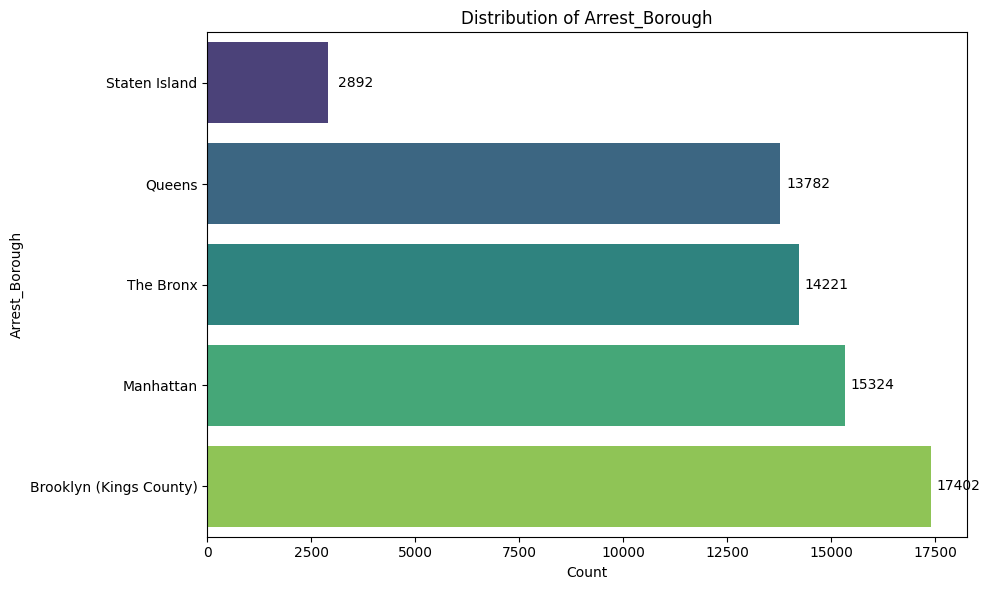

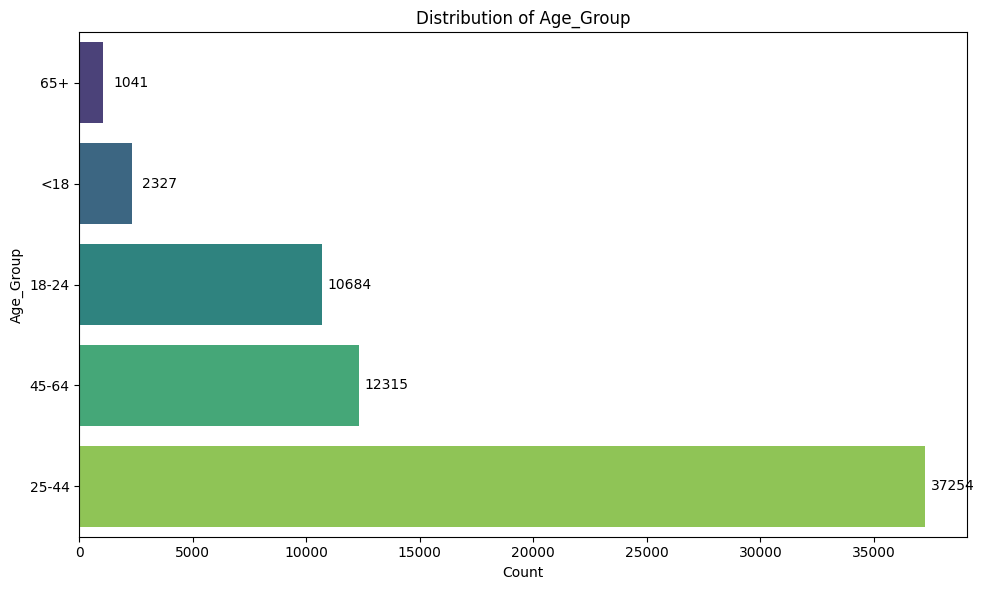

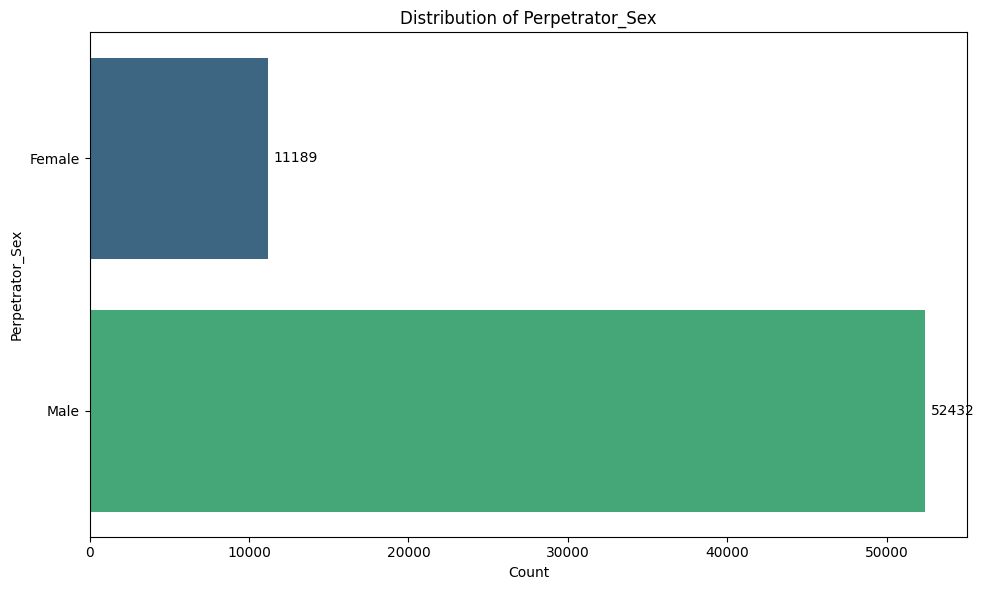

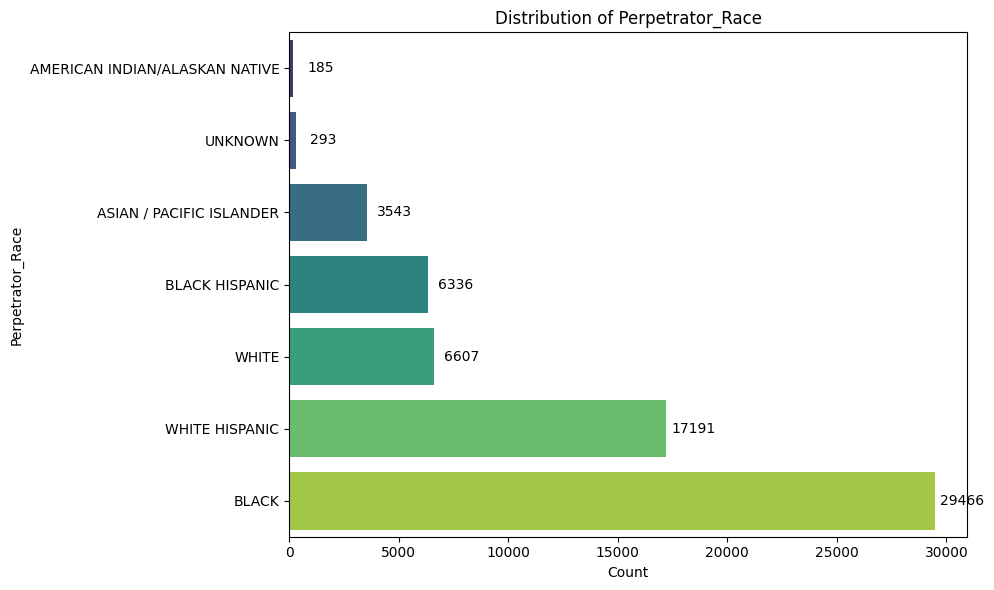

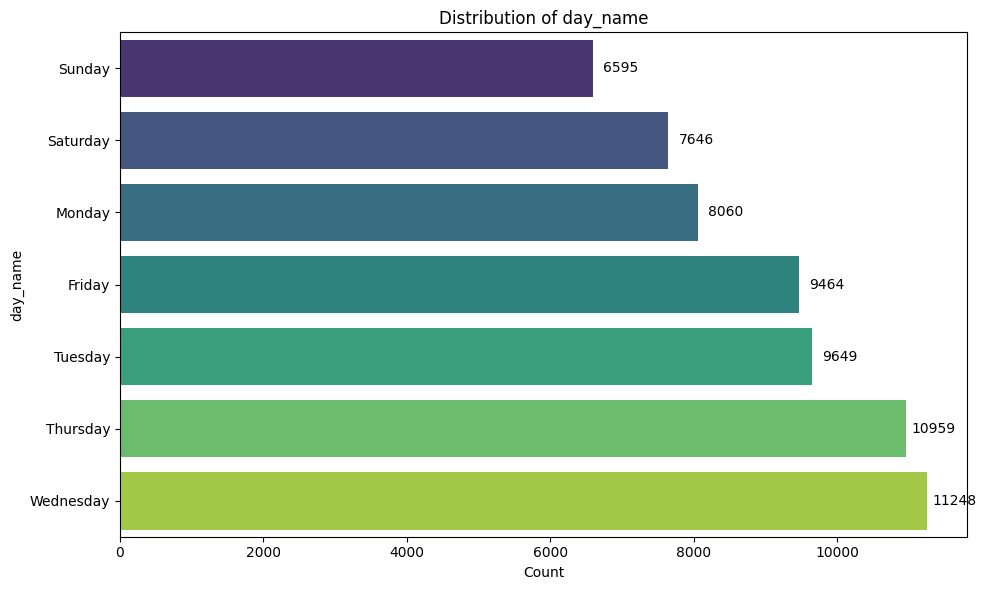

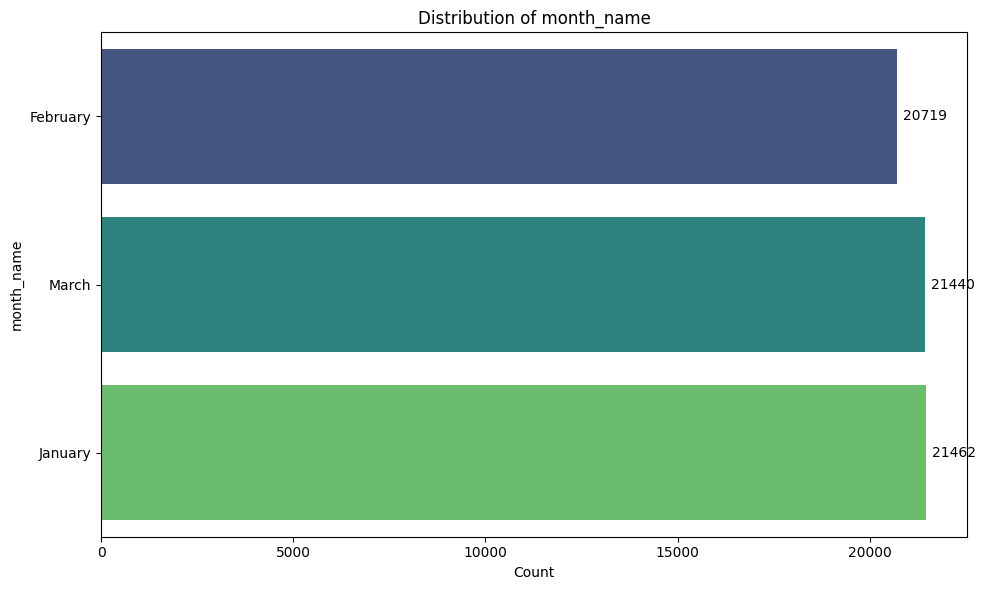

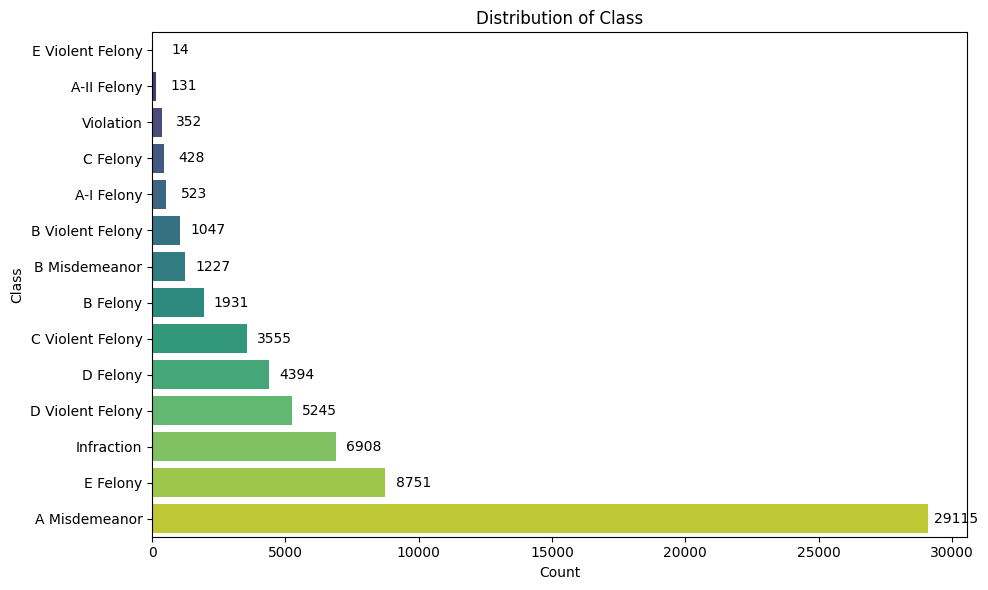

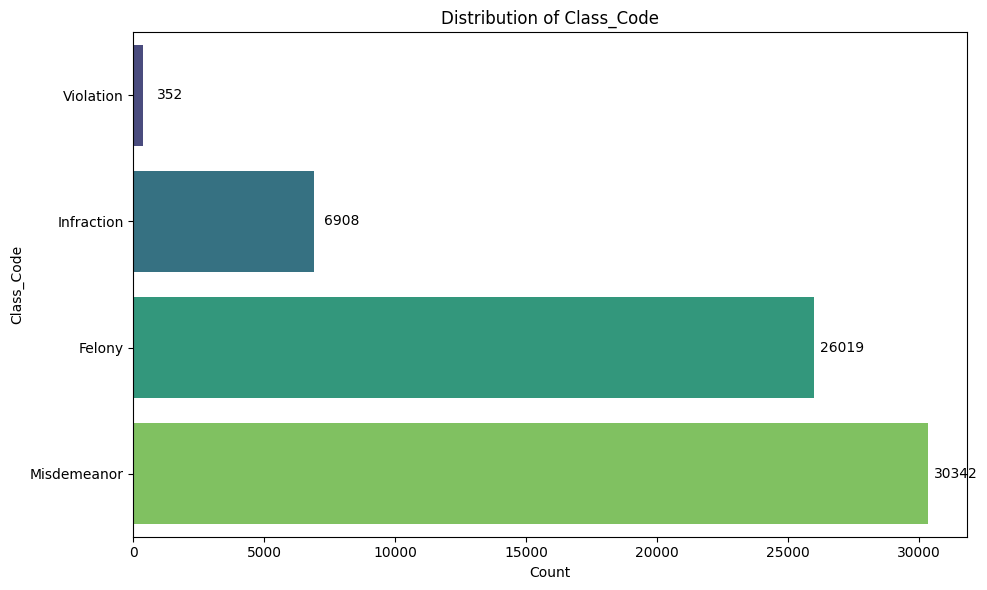

In [ ]:
categorical_columns = ['Arrest_Borough', 'Age_Group', 'Perpetrator_Sex', 'Perpetrator_Race', 'day_name', 'month_name', 'Class', 'Class_Code']
eda.plot_categorical_distribution(df, categorical_columns)

## How do crime severity indicators correspond to different crime class codes?

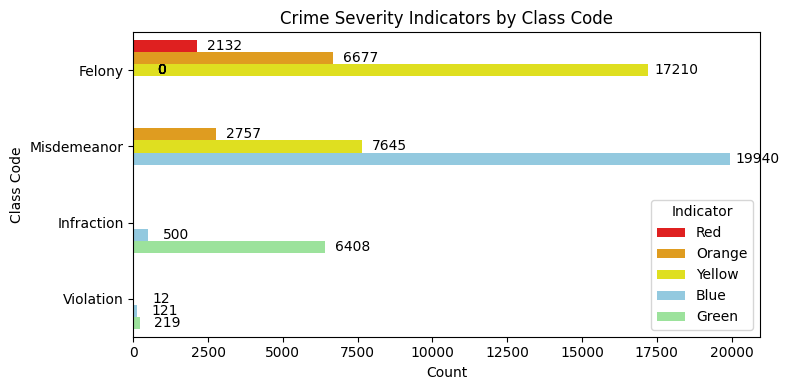

In [ ]:
eda.plot_crime_severity_by_class(df)

## What is the distribution of perpetrator demographics across different races and sexes?


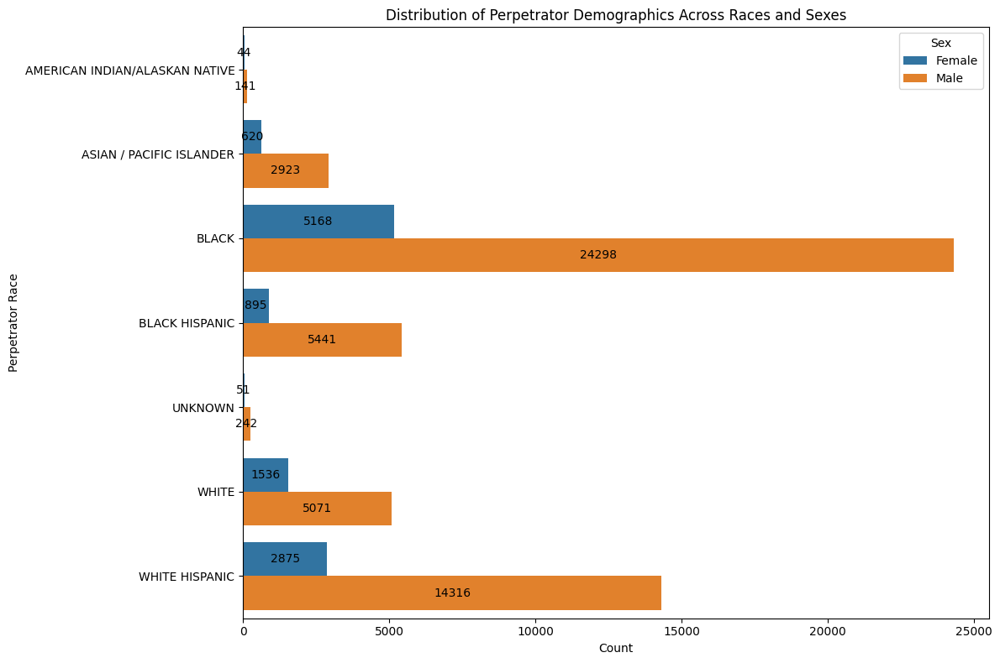

In [ ]:
eda.plot_perpetrator_demographics(df)


## Do certain boroughs show higher arrest activity on specific days compared to others?



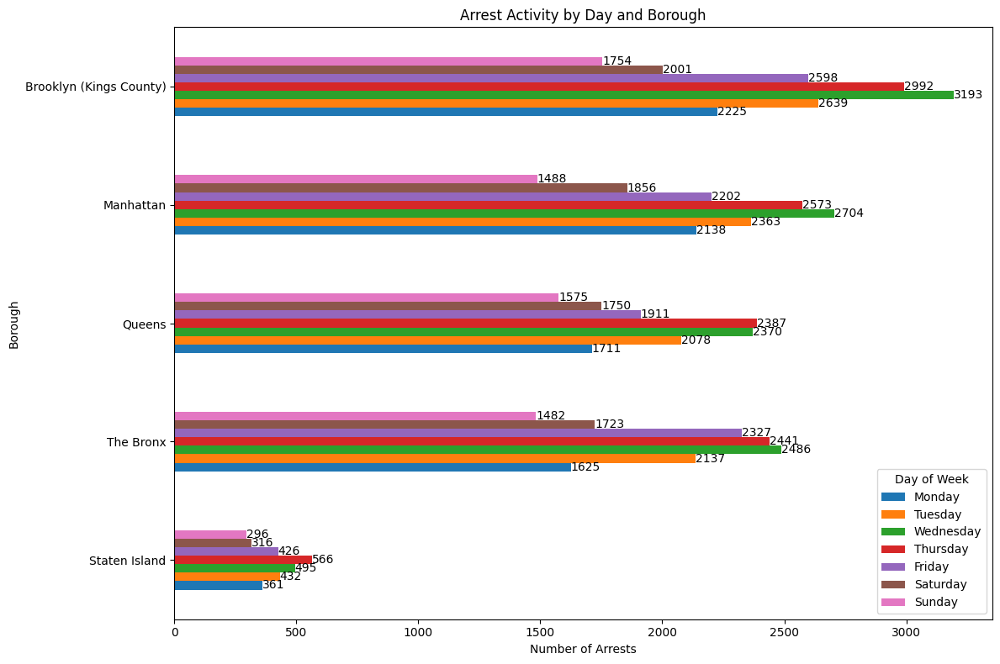

In [ ]:
eda.plot_arrest_activity(df)


## Are there boroughs where specific types of crimes are more prevalent compared to others?

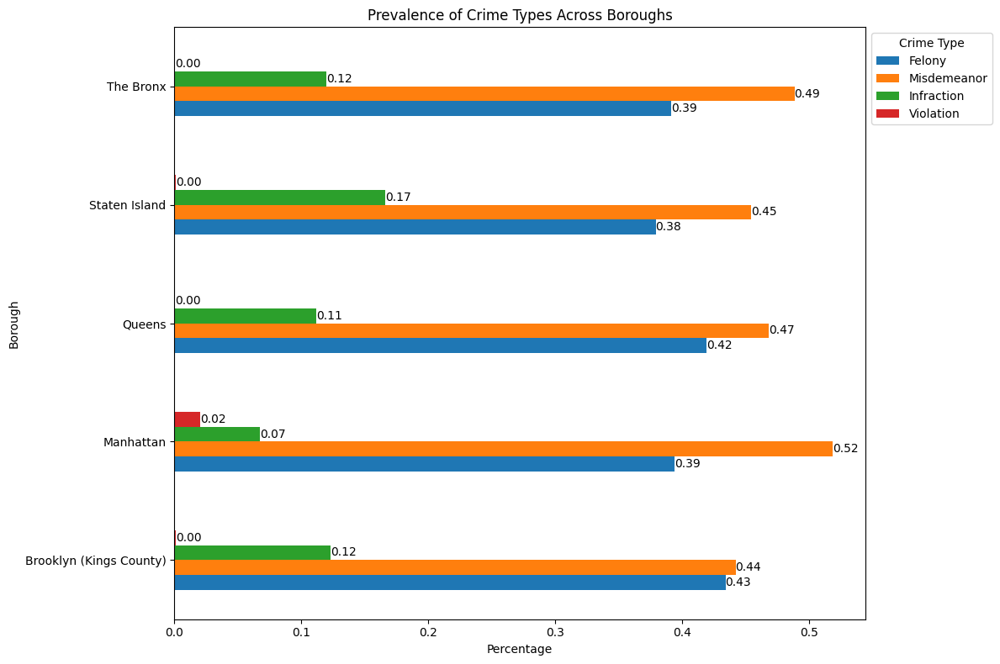

In [ ]:
eda.plot_crime_types_by_borough(df)


## How do crime severity indicators vary across different boroughs?



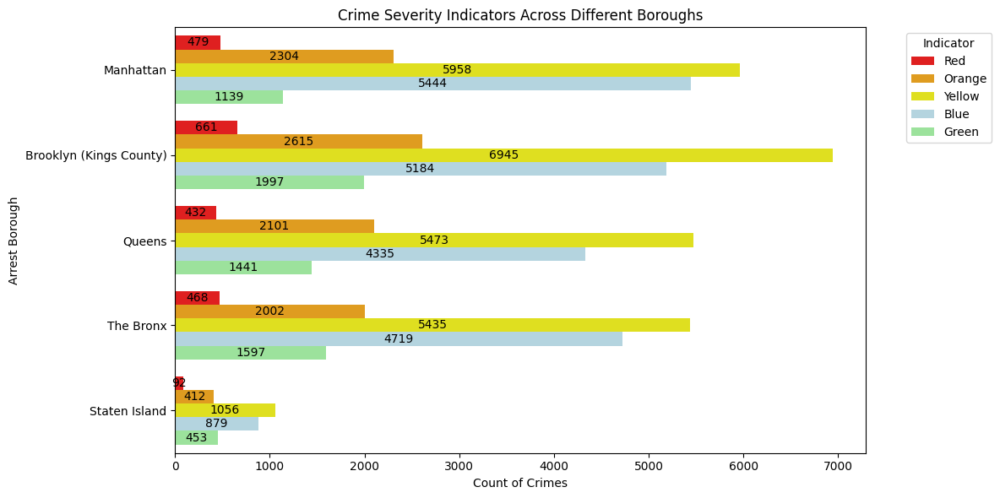

In [ ]:
eda.plot_crime_severity_indicators(df)


In [ ]:
fig = eda.plot_spatial_distribution(df)
fig.write_html("spatial Distribution of Crimes map.html")
fig.show()



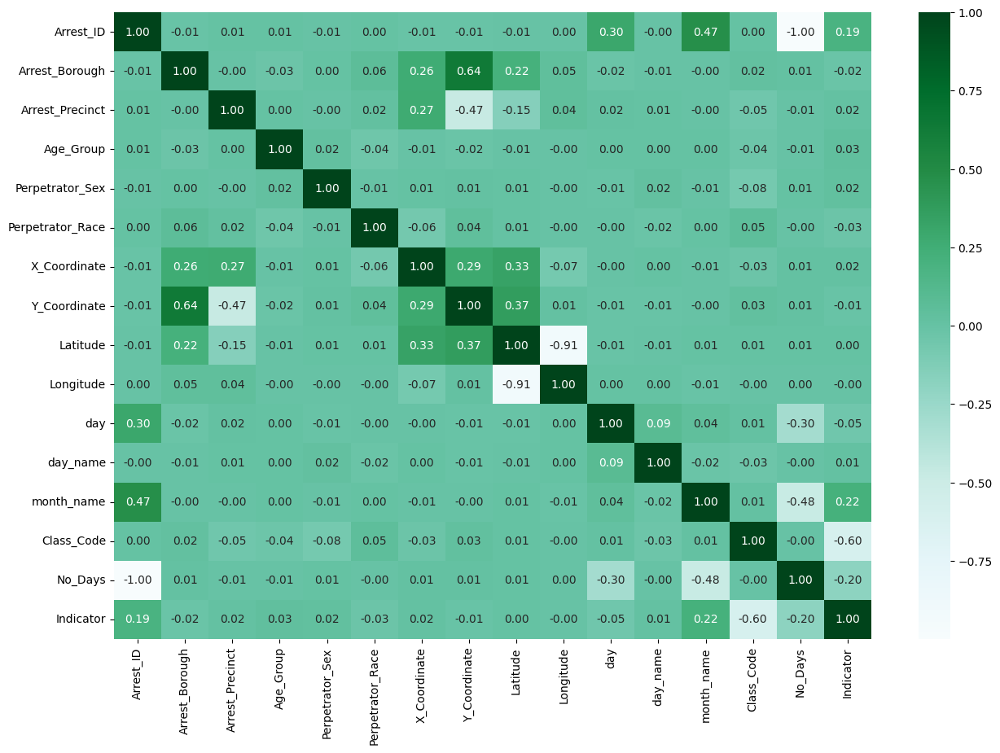

In [ ]:

categorical_columns = ['Arrest_Borough', 'Age_Group', 'Perpetrator_Sex', 'Perpetrator_Race', 'day_name', 'month_name', 'Class_Code', 'Indicator']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

numeric_df = df.select_dtypes(include='number')
del numeric_df['year']

correlation_matrix = numeric_df.corr()


plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='BuGn')

plt.show()
